<h1 style="text-align: center;">Telco Customer Churn EDA</h1>

<h2 style="text-align: center;">Mihai Lucian Bartha</h2>

<h3 style="text-align: center;">Dataset - WA_Fn-UseC_-Telco-Customer-Churn.csv</h3>

<center>
  <img src="assets/telco.png" alt="Telco Logo" width="250"/>
</center>


<hr>

## 📊 Telco Communications Churn Prediction - Exploratory Data Analysis

## Introduction  

Customer churn is a critical challenge in the telecommunications industry, as retaining existing customers is often more cost-effective than acquiring new ones. Predicting which customers are likely to leave (churn) enables businesses to take proactive measures such as offering targeted incentives, improving customer service, or personalizing retention strategies.  

This project focuses on **Exploratory Data Analysis (EDA)** of the **Telco Customer Churn dataset**, which contains information on **7,043 customers** and **21 features** related to their demographics, subscription details, and account information. Features include variables such as customer tenure, internet service type, payment method, and monthly charges. The target variable, `Churn`, indicates whether a customer has discontinued the service.  

### Objectives
1. Explore and understand the dataset’s structure, patterns, and key features influencing customer churn. - Done On PowerBI Dashboard  
2. Perform visual and statistical analysis that highlights relationships between customer demographics, service usage, and churn behavior.  
3. Generate insights that will guide the development of machine learning models for churn prediction in future stages.  

By performing EDA, we aim to uncover the main drivers of churn in the telecom sector and provide actionable insights that can help reduce customer attrition. Through this EDA, We will also aim to use machine Learning concepts to predict customer churn.


<hr>

<h2> Importing Libraries </h2>

In [417]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import warnings 
warnings.filterwarnings("ignore")

In [418]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import root_mean_squared_error
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

<hr>

<h2>Understanding The Data</h2>

In [419]:
df = pd.read_csv('WA_Fn-UseC_-Telco-Customer-Churn.csv') #Reading the csv file

In [420]:
df.head() #Display the data

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


## Customer Information
- **customerID** – Unique identifier for each customer  
- **gender** – Whether the customer is Male or Female  
- **SeniorCitizen** – 0 = No, 1 = Yes (indicates senior status)  
- **Partner** – Whether the customer has a partner (Yes/No)  
- **Dependents** – Whether the customer has dependents (Yes/No)  

## Account Information
- **tenure** – Number of months the customer has stayed with the company  
- **Contract** – Type of contract: Month-to-month, One year, Two year  
- **PaperlessBilling** – Whether the customer uses paperless billing (Yes/No)  
- **PaymentMethod** – Payment method: Electronic check, Mailed check, Bank transfer, Credit card  

## Services Signed Up
- **PhoneService** – Whether the customer has phone service (Yes/No)  
- **MultipleLines** – If the customer has multiple lines (No, Yes, No phone service)  
- **InternetService** – Internet provider: DSL, Fiber optic, or No  
- **OnlineSecurity** – Whether the customer has online security add-on (Yes/No/No internet service)  
- **OnlineBackup** – Whether the customer has online backup (Yes/No/No internet service)  
- **DeviceProtection** – Whether the customer has device protection (Yes/No/No internet service)  
- **TechSupport** – Whether the customer has tech support (Yes/No/No internet service)  
- **StreamingTV** – Whether the customer has streaming TV (Yes/No/No internet service)  
- **StreamingMovies** – Whether the customer has streaming movies (Yes/No/No internet service)  

## Billing & Charges
- **MonthlyCharges** – Amount charged to the customer monthly  
- **TotalCharges** – Total amount charged to the customer  

## Target Column
- **Churn** – Whether the customer left the company (Yes/No)  


In [421]:
df.shape #See the rows x columns

(7043, 21)

In [422]:
df.size #Size of dataset

147903

In [423]:
df.describe() #Statistical info about the dataset

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [424]:
df.columns.values #see all columns

array(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract',
       'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges',
       'TotalCharges', 'Churn'], dtype=object)

In [425]:
df.info() #More info on dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


<hr>

<h2>Missing Values </h2>

In [426]:
df.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

As we can see we have no Missing Values for the data set with the current data types given to the columns.

<hr>

<h2>Data Manipulation </h2>

In [427]:
df.dtypes #See the data types of each column

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

Data Summary: Data Type & Missing Values
- ✅ All columns complete except ❌ TotalCharges


In [428]:
#Changing data type of TotalCharges to integer
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')


In [429]:
#Printing the Nulls for total charge
print("Total Charge Nulls -", df['TotalCharges'].isna().sum())

print('\n')

#Printing Nulls for whole dataframe to see if other columns affected
print('Full dataframe Nulls \n')

df.isna().sum()

Total Charge Nulls - 11


Full dataframe Nulls 



customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [430]:

#filling the null Values with the mean of TotalCharges
df.fillna({'TotalCharges': df['TotalCharges'].mean}, inplace=True)



In [431]:
#Printing Nulls for whole dataframe to see if other columns affected
print('Full dataframe After Fillna \n')

df.isna().sum()

Full dataframe After Fillna 



customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [432]:
#Grouping the services
Services = ['PhoneService','MultipleLines','InternetService','OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies']

df[Services].describe()

,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
count,7043,7043,7043,7043,7043,7043,7043,7043,7043
unique,2,3,3,3,3,3,3,3,3
top,Yes,No,Fiber optic,No,No,No,No,No,No
freq,6361,3390,3096,3498,3088,3095,3473,2810,2785


In [433]:
#Ignore warnings
warnings.filterwarnings("ignore")

#Ensure numeric columns
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['tenure'] = pd.to_numeric(df['tenure'], errors='coerce')

#Create Average Monthly Charge safely
df['AverageMonthlyCharge'] = df['TotalCharges'] / df['tenure']

#convert to int safely by filling NaN first
df['AverageMonthlyCharge'] = df['AverageMonthlyCharge'].fillna(0).astype(int)

# Check columns
print(df.columns)

# Reset warnings
warnings.resetwarnings()


Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn',
       'AverageMonthlyCharge'],
      dtype='object')


In [434]:
#Checking the dataset for Duplicate
print("Checking for duplicates in the dataset :", df.duplicated().sum())

Checking for duplicates in the dataset : 0


<hr>

<h2>Data Visualisations </h2>

<p> The data Visualisations that you see in this report are done for the purpose of using the plotly library, along with not being included inside of the <br> power BI Churn Dashboard.<p>

In [436]:
#plotly config for grpah
fig = px.histogram(df,x = "MonthlyCharges",
                   color = "Contract",
                   marginal = "violin",
                   title="Contract Distribution", 
                   color_discrete_sequence = ["Black","Grey","Red"],
                   hover_data = df.columns)

#Display the graph
fig.show()

In [437]:
#Setting up Sub frame
Manual = df[df["PaymentMethod"].isin(["Electronic check","Mailed check"])]

#plotly config for grpah
fig = px.histogram(Manual,x = "MonthlyCharges",
                   color = "PaymentMethod",
                   marginal = "rug",
                   title="Payment method Distribution Manual", 
                   color_discrete_sequence = ["Red","Grey"],
                   hover_data = df.columns)

#Display the graph
fig.show()

In [438]:
#Setting up Sub frame
Automatic = df[df["PaymentMethod"].isin(["Bank transfer (automatic)","Credit card (automatic)"])]

#plotly config for grpah
fig = px.histogram(Automatic,x = "MonthlyCharges",
                   color = "PaymentMethod",
                   marginal = "box",
                   title="Payment method Distribution Automatic", 
                   color_discrete_sequence = ["Black","Red"],
                   hover_data = df.columns)

#Display the graph
fig.show()

In [439]:
#Grouping by Tenure and dependents
grouped_by = df.groupby(["tenure","Dependents"],as_index = False)["AverageMonthlyCharge"].mean()

#Graph configs
fig = px.line(grouped_by,x = "tenure" ,
             y = "AverageMonthlyCharge",
             title = "Average Monthly Charge by Dependents",
             color = "Dependents",
             line_shape = "spline",
             color_discrete_sequence = ["black", "grey"])

#Showing the graph
fig.show()

In [440]:
#Config for graph
fig = px.pie(df,
             values = "TotalCharges",
             names = "Partner",
             title = "Total Charges by partner (yes/no)",
             color_discrete_sequence = ["black", "grey"])
             
#Displaying the graph
fig.show()

In [441]:
import pandas as pd
import plotly.express as px

Services = ['PhoneService','MultipleLines','InternetService','OnlineSecurity',
            'OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies']

# Melt the DataFrame so each service becomes a row
df_melted = df.melt(id_vars=['Churn'], value_vars=Services, 
                    var_name='Service', value_name='Provided')

# Keep only rows where service was provided ('Yes')
df_provided = df_melted[df_melted['Provided'] == 'Yes']

# Count churn by service
counts = df_provided.groupby(['Service', 'Churn']).size().reset_index(name='Count')

# Plot
fig = px.bar(counts,
             x='Service',
             y='Count',
             color='Churn',
             title='Churn Counts by Service',
             color_discrete_sequence = ['black','grey'],
             barmode='group')  # 'stack' for stacked bars

fig.show()


<hr>

<h2> Data Pre Processing </h2>

In [442]:
#Encoding Categorical variables
Binary_columns = ['Dependents', 'Partner', 'PhoneService', 'Churn', 'PaperlessBilling']

for col in Binary_columns :
    df[col] = df[col].map({"Yes" : 1, "No" : 0})

#Some Services have "no internet service" or "no phone service"
services_columns = ['OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies']
for col in services_columns :
    df[col] = df[col].map({"Yes" : 1, "No" : 0, "No internet service" : 0})
    
df['MultipleLines'] = df['MultipleLines'].map({"Yes" : 1, "No" : 0, "No phone service" : 0})

#Encoding Gender column
df['gender'] = df['gender'].map({"Male" : 1, "Female" : 0})

# Encoding multi-class categorical columns (InternetService, Contract, PaymentMethod) with get_dummies
InternetService_dummies = pd.get_dummies(df['InternetService']).astype(int)
Contract_dummies = pd.get_dummies(df['Contract']).astype(int)
Payment_dummies = pd.get_dummies(df['PaymentMethod']).astype(int)

#Adding to data frame
df = pd.concat([df, InternetService_dummies, Contract_dummies, Payment_dummies], axis=1)

#Could drop the columns
df = df.drop("InternetService",axis = 1)
df = df.drop("Contract", axis = 1)
df = df.drop("PaymentMethod", axis = 1)


#Filling Nulls of TotalCharges (Bug from jupyter Notebook)
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].mean())

In [443]:
#checking Data frame for Nulls
print("Checking Columns for missing items")
print("\n")
print(df.isna().sum())

#Checking data frame
df.head(5)

Checking Columns for missing items


customerID                   0
gender                       0
SeniorCitizen                0
Partner                      0
Dependents                   0
tenure                       0
PhoneService                 0
MultipleLines                0
OnlineSecurity               0
OnlineBackup                 0
DeviceProtection             0
TechSupport                  0
StreamingTV                  0
StreamingMovies              0
PaperlessBilling             0
MonthlyCharges               0
TotalCharges                 0
Churn                        0
AverageMonthlyCharge         0
DSL                          0
Fiber optic                  0
No                           0
Month-to-month               0
One year                     0
Two year                     0
Bank transfer (automatic)    0
Credit card (automatic)      0
Electronic check             0
Mailed check                 0
dtype: int64


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,...,DSL,Fiber optic,No,Month-to-month,One year,Two year,Bank transfer (automatic),Credit card (automatic),Electronic check,Mailed check
0,7590-VHVEG,0,0,1,0,1,0,0,0,1,...,1,0,0,1,0,0,0,0,1,0
1,5575-GNVDE,1,0,0,0,34,1,0,1,0,...,1,0,0,0,1,0,0,0,0,1
2,3668-QPYBK,1,0,0,0,2,1,0,1,1,...,1,0,0,1,0,0,0,0,0,1
3,7795-CFOCW,1,0,0,0,45,0,0,1,0,...,1,0,0,0,1,0,1,0,0,0
4,9237-HQITU,0,0,0,0,2,1,0,0,0,...,0,1,0,1,0,0,0,0,1,0


In [444]:
#renaming the No column
df = df.rename(
    columns = {
        'No' : 'No Internet Service' })

#Dropping CustomerID column
df = df.drop("customerID",axis = 1)


#Verifying the changes
df.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'Churn',
       'AverageMonthlyCharge', 'DSL', 'Fiber optic', 'No Internet Service',
       'Month-to-month', 'One year', 'Two year', 'Bank transfer (automatic)',
       'Credit card (automatic)', 'Electronic check', 'Mailed check'],
      dtype='object')

<hr>

<h2> Modelling And Evaluation </h2>

In [455]:
#Setting up X : holds the dataframe and y :holds Churn Predictions
X = df.drop('Churn',axis = 1)
y = df['Churn']

#Train and test split
X_train, X_test, y_train, y_test,  = train_test_split(X, y, test_size = 0.4,
                                                      random_state = 21, stratify = y)

#fitting the model
knn = KNeighborsClassifier(n_neighbors = 6)
knn.fit(X_train, y_train)

#printing the accuracy of the model
print("Accuracy of KNN model :",knn.score(X_test, y_test))

Accuracy of KNN model : 0.769694819020582


In [446]:
#Setting up X and y 
X = df.drop('Churn',axis = 1)
y = df['Churn']

#Scaling the train and test X 
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)   # fit on training set
X_test_scaled = scaler.transform(X_test)         # transform test set only



X_train, X_test, y_train, y_test,  = train_test_split(X, y, test_size = 0.4,
                                                      random_state = 21, stratify = y)

#Fitting the model
knn = KNeighborsClassifier(n_neighbors = 6)
knn.fit(X_train_scaled, y_train)

y_pred = knn.predict(X_test_scaled)

#Printing info about the model
print("Accuracy of KNN model : \n",knn.score(X_test_scaled, y_test))
print("\n")
print("Confusion Matrix - \n",confusion_matrix(y_test,y_pred))
print("\n")
print("Classification Report - \n",classification_report(y_test,y_pred))
print("\n")

Accuracy of KNN model : 
 0.7654364797728885


Confusion Matrix - 
 [[1856  214]
 [ 447  301]]


Classification Report - 
               precision    recall  f1-score   support

           0       0.81      0.90      0.85      2070
           1       0.58      0.40      0.48       748

    accuracy                           0.77      2818
   macro avg       0.70      0.65      0.66      2818
weighted avg       0.75      0.77      0.75      2818





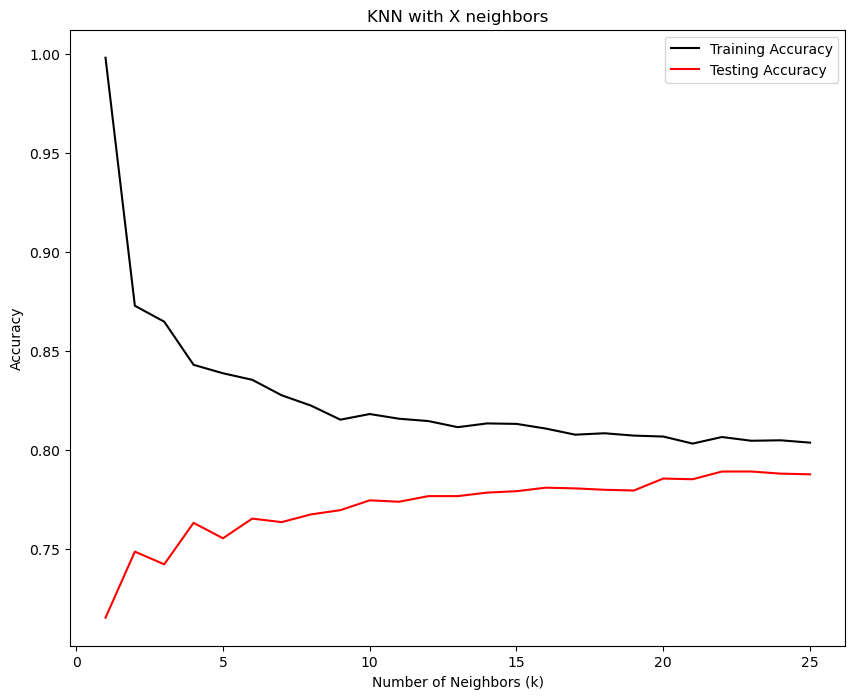

In [447]:
#Setting up list of train and test accuracies
train_accuracies = {}
test_accuracies = {}

#Setting up a list of neighbors
neighbors = np.arange(1,26)

#testing all of the neighbors
for neighbor in neighbors :
    knn = KNeighborsClassifier(n_neighbors = neighbor)
    knn.fit(X_train_scaled, y_train)
    train_accuracies[neighbor] = knn.score(X_train_scaled, y_train)
    test_accuracies[neighbor] = knn.score(X_test_scaled, y_test)
    

#Plotting the results
plt.figure(figsize = (10,8))
plt.title("KNN with X neighbors")
plt.plot(neighbors,train_accuracies.values(), label = "Training Accuracy", color = "black")
plt.plot(neighbors,test_accuracies.values(), label = "Testing Accuracy", color = "red")
plt.legend()
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.show()

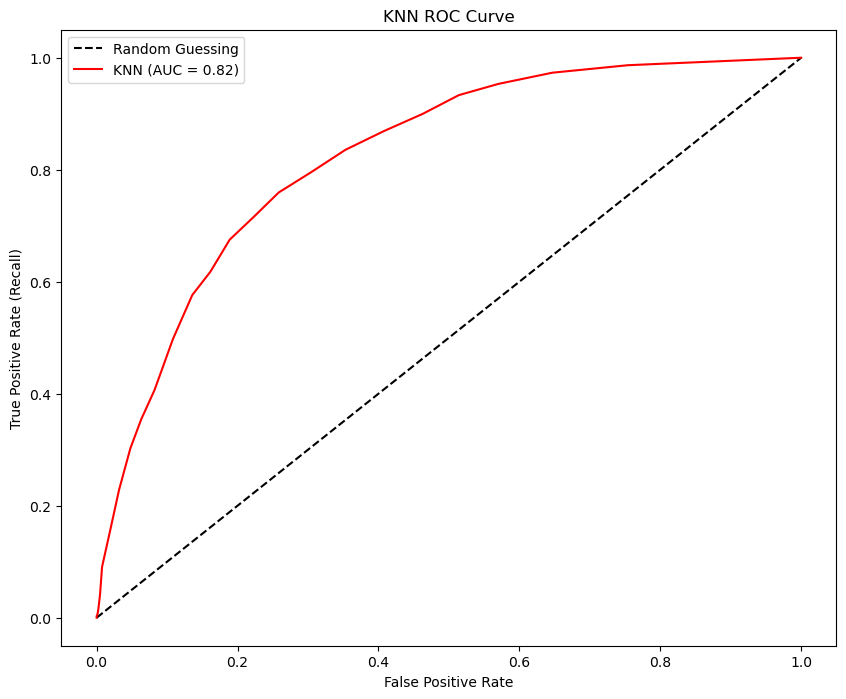

In [448]:
# Get the predicted probabilities for the positive class (churn = 1)
y_proba_knn = knn.predict_proba(X_test_scaled)[:, 1]  

# Compute the AUC score (area under the ROC curve)
auc = roc_auc_score(y_test, y_proba_knn)

# Compute the ROC curve values: False Positive Rate, True Positive Rate, and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_proba_knn)

# Plot the ROC curve
plt.figure(figsize=(10, 8))

# Plot the baseline (random guessing) diagonal
plt.plot([0, 1], [0, 1], linestyle="--", label="Random Guessing", color = "black")

# Plot the ROC curve for the KNN model
plt.plot(fpr, tpr, label=f"KNN (AUC = {auc:.2f})", color ="Red")

# Label axes and title
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate (Recall)")
plt.title("KNN ROC Curve")

# Show legend
plt.legend()

# Display the plot
plt.show()


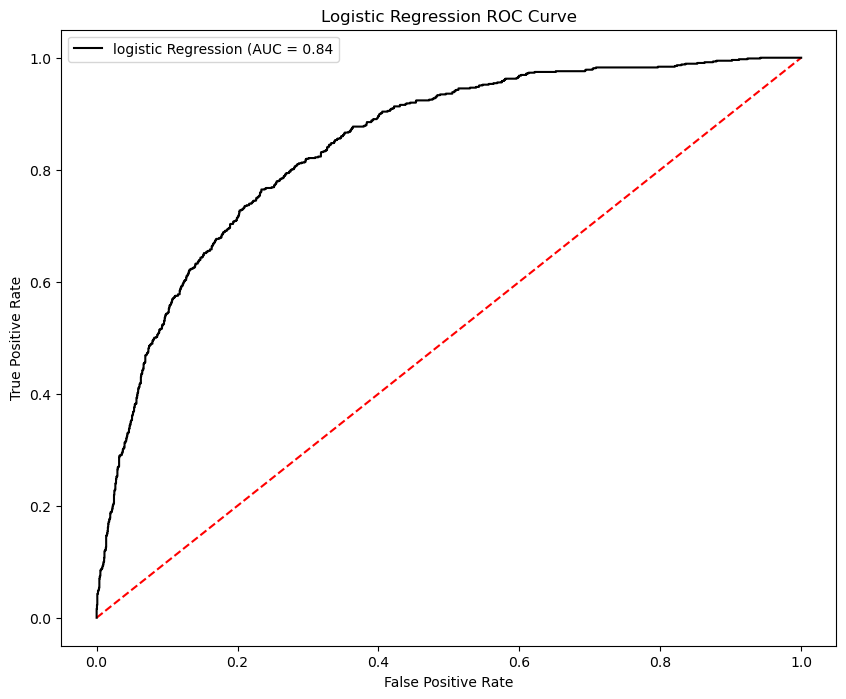

In [449]:
#Logistic Regression
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.4, random_state = 21, stratify = y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Training the model
logreg = LogisticRegression(max_iter=5000, class_weight='balanced',random_state=5)
logreg.fit(X_train_scaled, y_train)

#making Predictions
y_prediction_logreg = logreg.predict(X_test_scaled)
y_pred_probability = logreg.predict_proba(X_test_scaled)[:,1]


#setting up roc_curve
fpr, tpr, threshold = roc_curve(y_test,y_pred_probability)

auc2 = roc_auc_score(y_test, y_pred_probability)

#plotting curve
plt.figure(figsize=(10, 8))
plt.plot([0,1], [0,1], linestyle="--", color ="red")

plt.plot(fpr,tpr,color = "black",label=f"logistic Regression (AUC = {auc2:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression ROC Curve")
plt.legend()

plt.show()

In [450]:
#Showing Confusion Matrix for logistic Regression
print("Confusion Matrix for Logistic Regression- \n",confusion_matrix(y_test,y_prediction_logreg))

print("\n")

#Showing Classification report
print("Classification Report - \n",classification_report(y_test,y_prediction_logreg))



Confusion Matrix for Logistic Regression- 
 [[1499  571]
 [ 150  598]]


Classification Report - 
               precision    recall  f1-score   support

           0       0.91      0.72      0.81      2070
           1       0.51      0.80      0.62       748

    accuracy                           0.74      2818
   macro avg       0.71      0.76      0.72      2818
weighted avg       0.80      0.74      0.76      2818



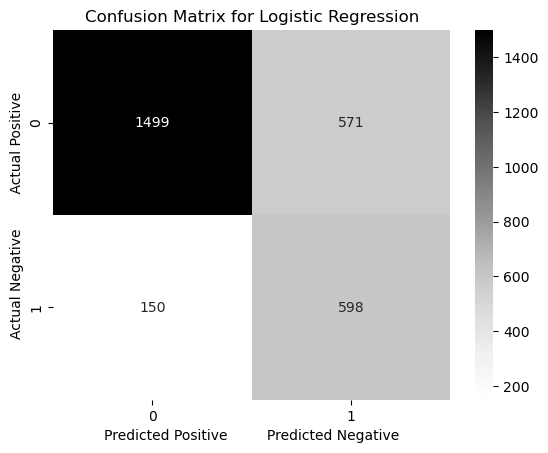

In [451]:
#Plotting Confusion Matrix as heatmap visual
sns.heatmap(confusion_matrix(y_test, y_prediction_logreg), annot = True,fmt="d", cmap = "Greys")

#Graph plotting
plt.title("Confusion Matrix for Logistic Regression")
plt.xlabel("Predicted Positive         Predicted Negative")
plt.ylabel("Actual Negative        Actual Positive")

#Show graph
plt.show()

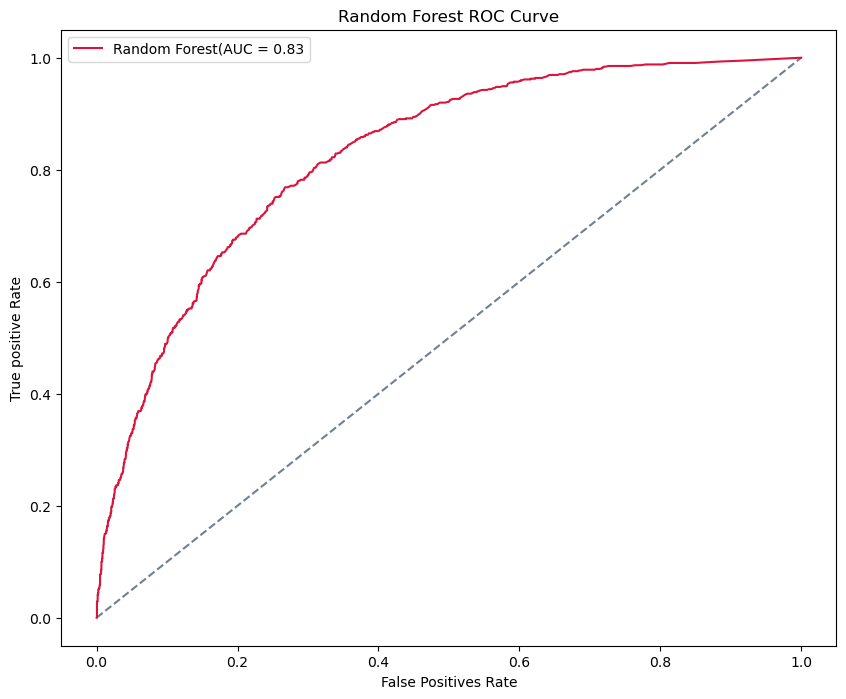

In [452]:
#Random Forest Classifier
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.4, random_state = 21, stratify = y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Random Forest Classifier
rf = RandomForestClassifier(
    n_estimators = 1000, #Number of trees
    max_depth = None, #Tree Depth (tunable)
    random_state = 41,
    class_weight = "balanced"
)

#Fitting the model
rf.fit(X_train_scaled, y_train)

y_pred_fr = rf.predict(X_test_scaled)
y_proba_fr = rf.predict_proba(X_test_scaled)[:,1] #Churn probability

#Setting up ROC curve
fpr, tpr, threshold = roc_curve(y_test,y_proba_fr)

#Calculating AUC score
auc3 = roc_auc_score(y_test,y_proba_fr)

#Graph plotting
plt.figure(figsize=(10, 8))
plt.plot([0,1], [0,1],linestyle="--", color ="Slategrey")

plt.plot(fpr,tpr, color = "Crimson", label=f"Random Forest(AUC = {auc3:.2f}")
plt.xlabel("False Positives Rate")
plt.ylabel("True positive Rate")
plt.title("Random Forest ROC Curve")

plt.legend()


#Show graph
plt.show()


In [453]:
#Showing Confusion Matrix for logistic Regression
print("Confusion Matrix for Random Forest Classifier- \n",confusion_matrix(y_test,y_pred_fr))

print("\n")

#Showing Classification report
print("Classification Report - \n",classification_report(y_test,y_pred_fr))

Confusion Matrix for Random Forest Classifier- 
 [[1872  198]
 [ 393  355]]


Classification Report - 
               precision    recall  f1-score   support

           0       0.83      0.90      0.86      2070
           1       0.64      0.47      0.55       748

    accuracy                           0.79      2818
   macro avg       0.73      0.69      0.70      2818
weighted avg       0.78      0.79      0.78      2818



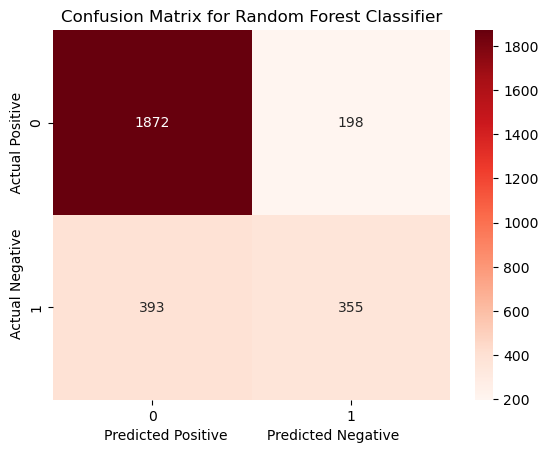

In [454]:
#Plotting Confusion Matrix as heatmap visual
sns.heatmap(confusion_matrix(y_test, y_pred_fr), annot = True,fmt="d", cmap = "Reds")

#Graph plotting
plt.title("Confusion Matrix for Random Forest Classifier")
plt.xlabel("Predicted Positive         Predicted Negative")
plt.ylabel("Actual Negative        Actual Positive")

#Show graph
plt.show()

<hr>

<h2> Evaluation </h2>

### Performance Metrics

- **AUC (overall ranking ability):**  
  Logistic (0.84) > Random Forest (0.83) > KNN (0.82)

- **Accuracy:**  
  Random Forest (79.03%) > KNN (76.54%) > Logistic (74.41%)

- **Recall (catching churners):**  
  Logistic (79.95%) >>> Random Forest (47.46%) > KNN (40.24%)

- **Precision (when predicted churn, how often correct):**  
  Random Forest (64.20%) > KNN (58.45%) > Logistic (51.15%)

- **F1 (balance of precision & recall):**  
  Logistic (62.39%) > Random Forest (54.57%) > KNN (47.66%)


### Why AUCs Are Similar but Predictions Differ

- **AUC** measures ranking ability across *all thresholds*.  
- Two models can rank customers similarly by churn probability (hence similar AUC) but the models behave differently (`0.5`).  
- **Logistic Regression** produces probabilities that lead to **many positive predictions** → higher recall but more false positives.  
- **Random Forest and KNN** are more conservative → fewer positives, higher precision, but lower recall.  

➡️ **Conclusion:** Same AUC ≠ same business behavior at default cutoff.


### Business-Driven Guidance

- **If the priority is to *catch as many churners as possible* (even with false alarms):**  
  → **Logistic Regression**  
  - Recall ~80% (finds most churners in the dataset)   
  - ⚠️ Caveat: Low precision (~51%) Which means that many non churners will be flagged in the process

- **If the priority is to focus only on likely churners:**  
  → **Random Forest**  
  - Best precision (64%) and overall accuracy out of all three
  - ⚠️ Caveat: Misses ~53% of churners unless the threshold is tuned

- **KNN**  
  - Has a decent Accuracy but weakest f1 and recal 
  - Can serve as a baseline, but not recommended for production

---
